# Cat old new analysis

Analysis related to the comparison between strategies ER_ACE and ER_AML with `cat_old_new` hyperparam enabled and not.
`cat_old_new` hyperparam is used to change the way to do the inference:
- when is set to false we do an inference of the new minibatch and then an inference of the old minibatch (the one sampled from the buffer replay).
- when is set to true we concatenate (cat stands for concat) the two minibatches (new and old) and do an inference with the concatenated tensor.

We expect that, using the not concatenated version, batch normalization layers suffer because in training phase if we have different statistics from new minibatch and buffer minibatch `current_mean` and `current_var` (updated with EMA) are not estimated well and probably fail during the inference phase.

Import of libraries.

In [1]:
import json

from src.utils.plot import plot_over_experiences, plot_forgetting, plot_general_results, plot_bn_stats_over_epochs, plot_bn_difference_over_epochs

Loading catoldnew results data.

In [2]:
with open('../data/catoldnew_results.json') as file:
    catoldnew_results = json.load(file)

General results in terms of AAA and accuracy related to ER_AML and ER_ACE with catoldnew set to False and True. We can tell that:
- AAA: ER_ACE seems to be better with cat_old_new set to true while for ER_AML there are no difference with respect the hyperparam.
- accuracy: Again for ER_ACE with cat_old_new set to true result is better while for ER_AML is the opposite.

In [3]:
plot_general_results(catoldnew_results)

,ER_ACE [cat_old_new=False],ER_ACE [cat_old_new=True],ER_AML [cat_old_new=False],ER_AML [cat_old_new=True]
AAA,29.2 %,30.22 %,27.6 %,27.33 %
accuracy,23.07 %,24.59 %,24.85 %,22.9 %
strategy_train_mb_size,10,10,10,10
strategy_eval_mb_size,10,10,10,10
strategy_train_epochs,1,1,1,1
strategy_mem_size,10000,10000,10000,10000
strategy_batch_size_mem,10,10,10,10
strategy_cat_old_new,False,True,False,True
sgd_lr,0.1,0.1,0.1,0.1
sgd_momentum,0,0,0,0


Plot of strategies accuracy over experiences. All strategies have more or less the same behavior.

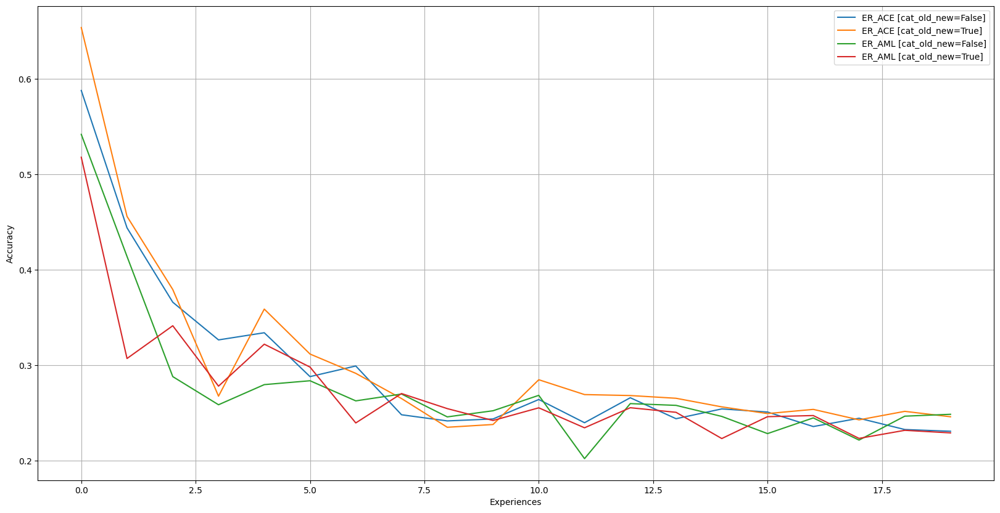

In [4]:
plot_over_experiences(
    {k: [sum(x.values()) / len(x.values()) for x in v['info']] for k, v in catoldnew_results.items()},
    xlabel='Experiences',
    ylabel='Accuracy'
)

Plot of histogram related to the strategies forgetting. Only the ER_AML with cat_old_new set to true has backward transfer. According other strategies ER_AML with cat_old_new set to false has less forgetting. ER_ACE with cat_old_new set to false has the highest forgetting. All the values are very close one to another; in face the range is more or less between -0.022 and 0.043.

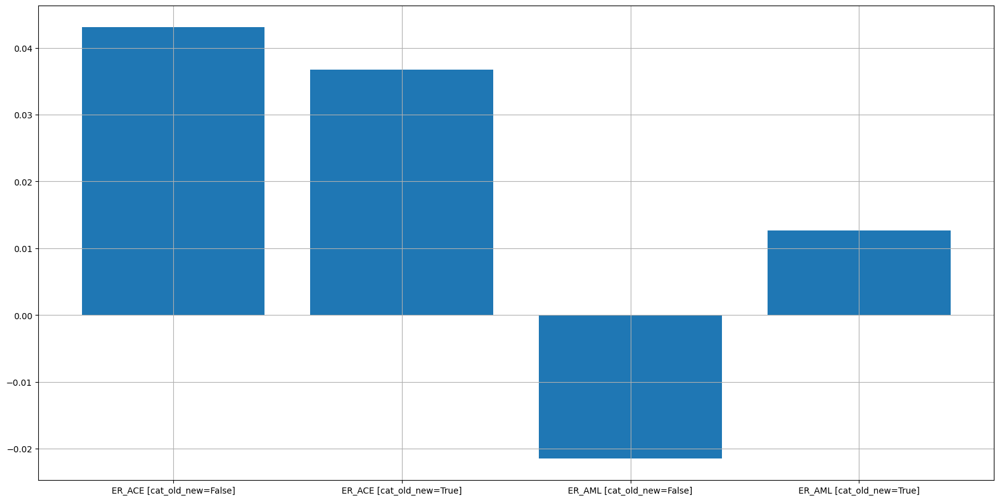

In [5]:
plot_forgetting(catoldnew_results)

Printing of ResNet18 (model used in experiments) minibatch layers. The result is the dictionary with:
- key: number of bn layer
- value: string representation of bn layer

In [6]:
from src.model import ResNet18
import torch

bn_layers = dict(enumerate([l for l in ResNet18(20).modules() if type(l) is torch.nn.BatchNorm2d]))

bn_layers

{0: BatchNorm2d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 1: BatchNorm2d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 2: BatchNorm2d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 3: BatchNorm2d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 4: BatchNorm2d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 5: BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 6: BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 7: BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 8: BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 9: BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 10: BatchNorm2d(80, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 11: BatchNorm2d(80, eps=1e-05, momentum=0.1, affine=True, track

Here we plot the smoothed difference between new minibatches and older ones (the ones sampled by buffer replay) for each strategy (ER_AML and ER_ACE) with hyperparam `cat_old_new` set to false and to true. We have a row of plots with this information for each batch normalization layer.

We expect to have higher difference for strategies with `cat_old_new` set to false. Results tell us that from 0 to 7 bn layer the main plots show an higher difference for `cat_old_new` set to false while in the others we have the opposite behavior (seems that here the curves are slightly closer).

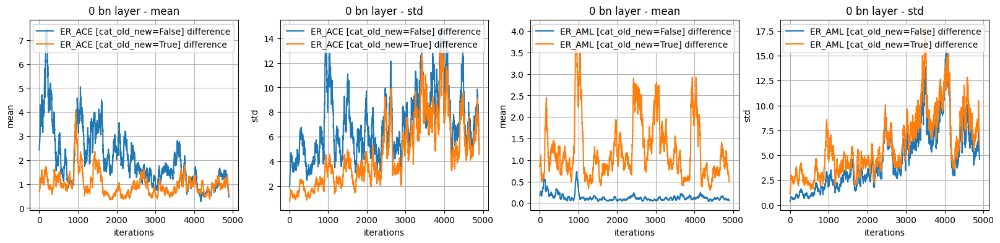

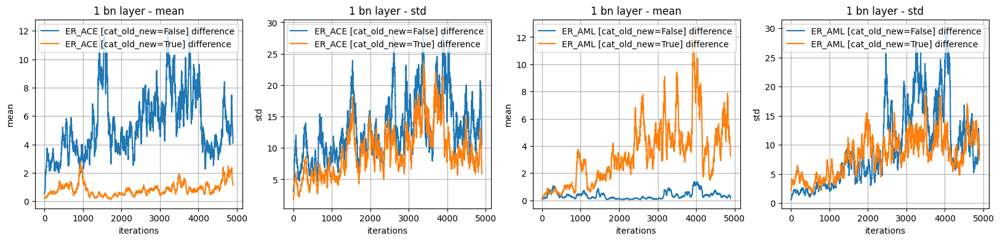

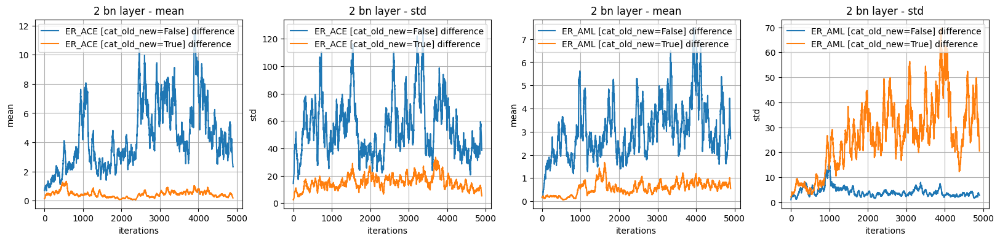

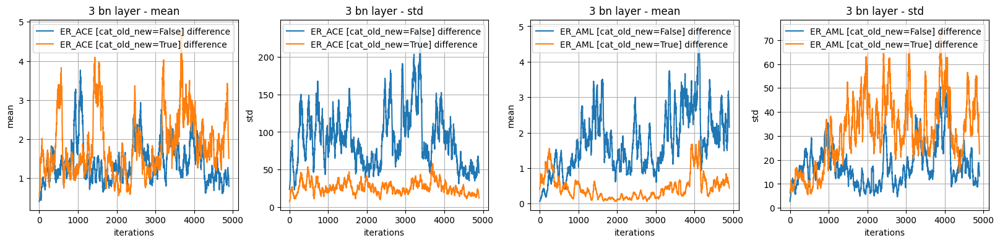

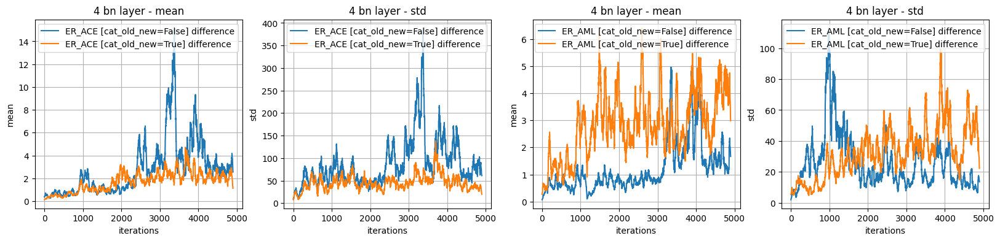

...

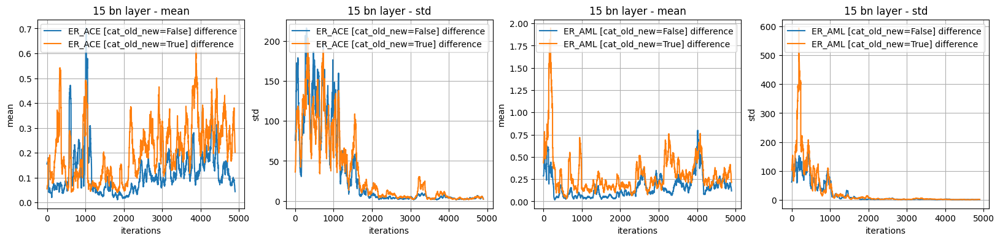

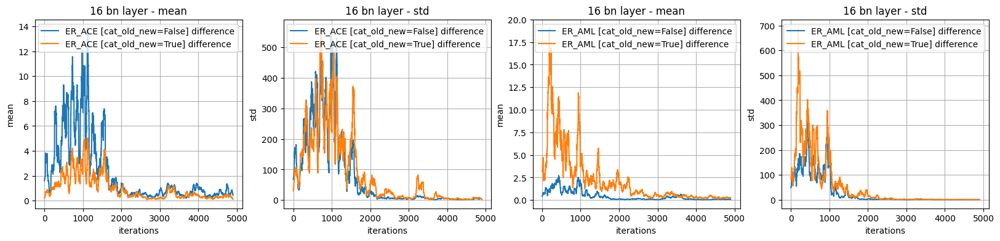

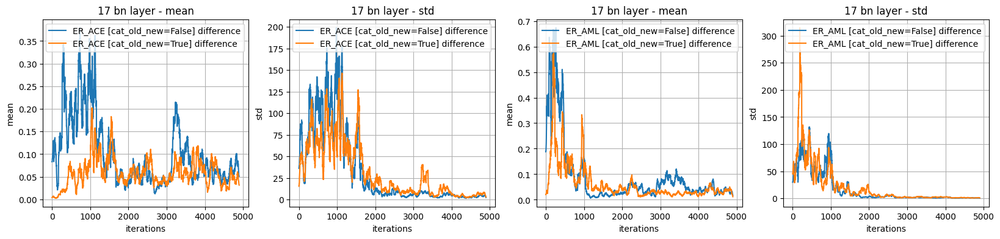

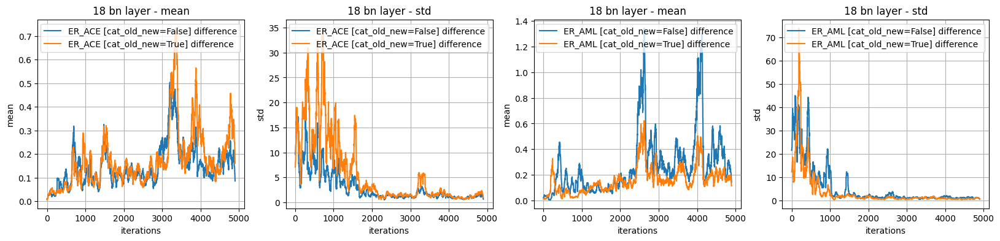

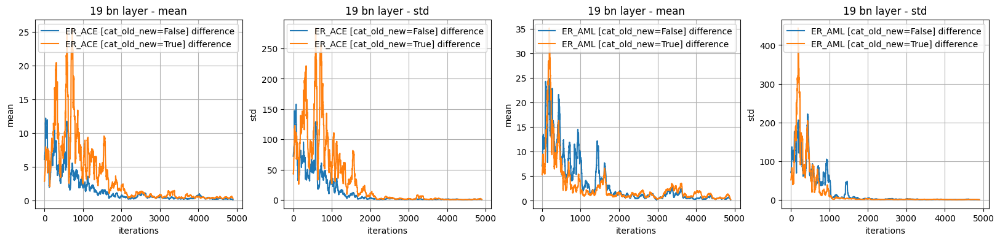

In [7]:
for n_layer in range(len(bn_layers)):
    plot_bn_difference_over_epochs(catoldnew_results, n_layer=n_layer)

Here we plot the smoothed values of statistics of new and old minibatches over iterations used above for difference. We can understand that in general plots of same strategy and layer with different `cat_old_new` hyperparam are similar. Also plots of same layers of ER_ACE and ER_AML seems to be similar.

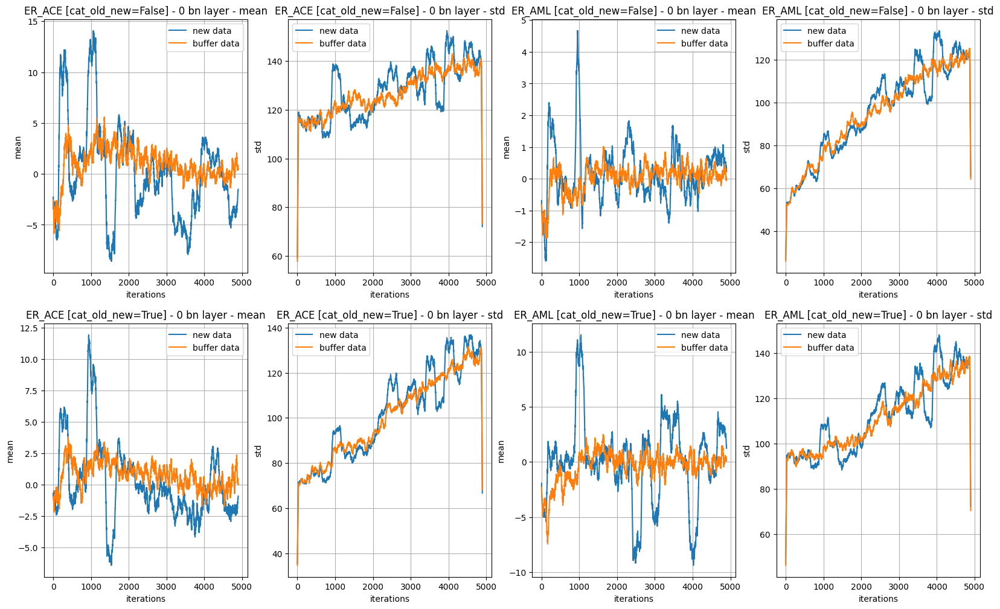

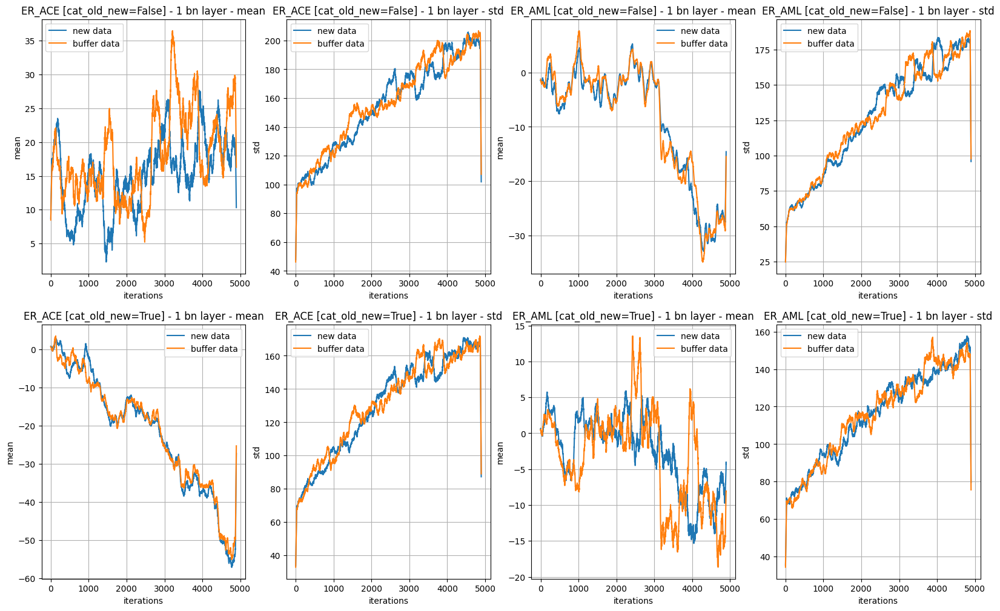

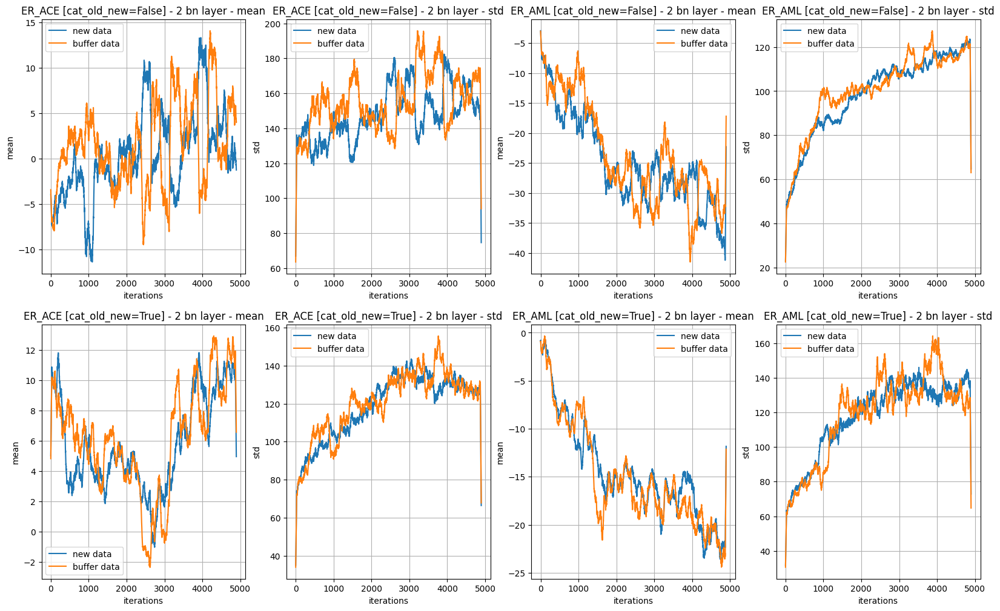

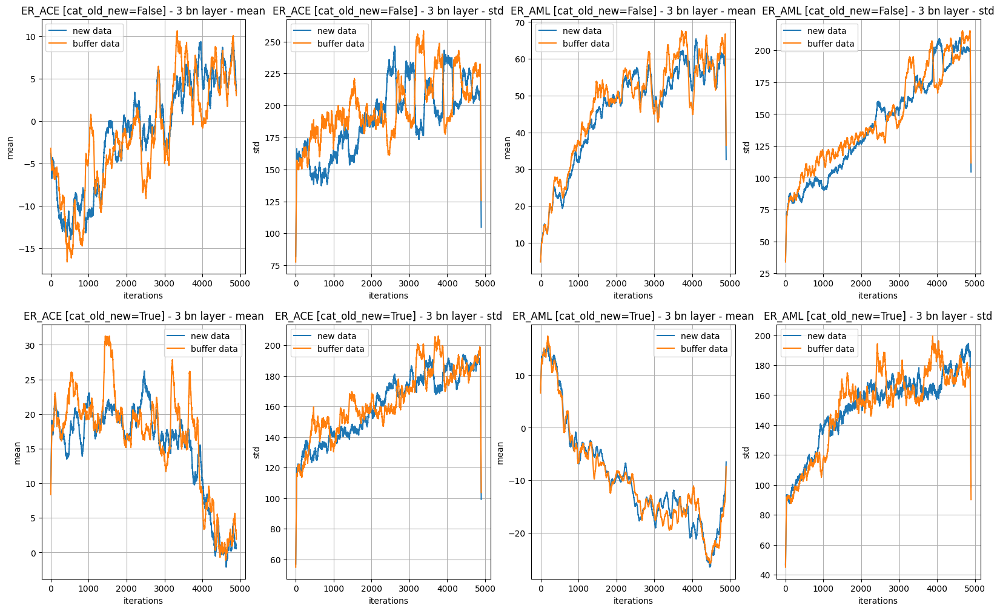

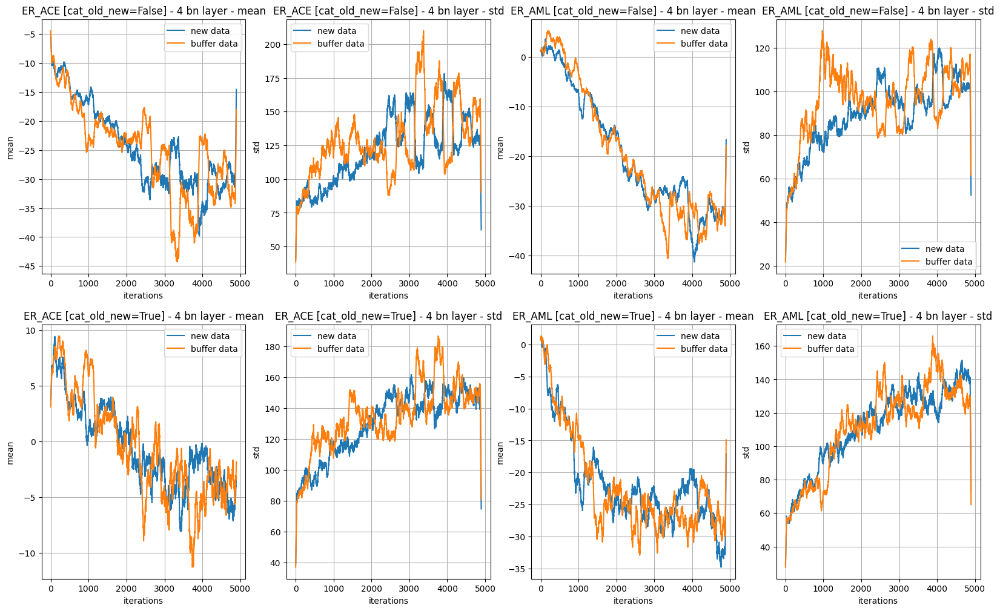

...

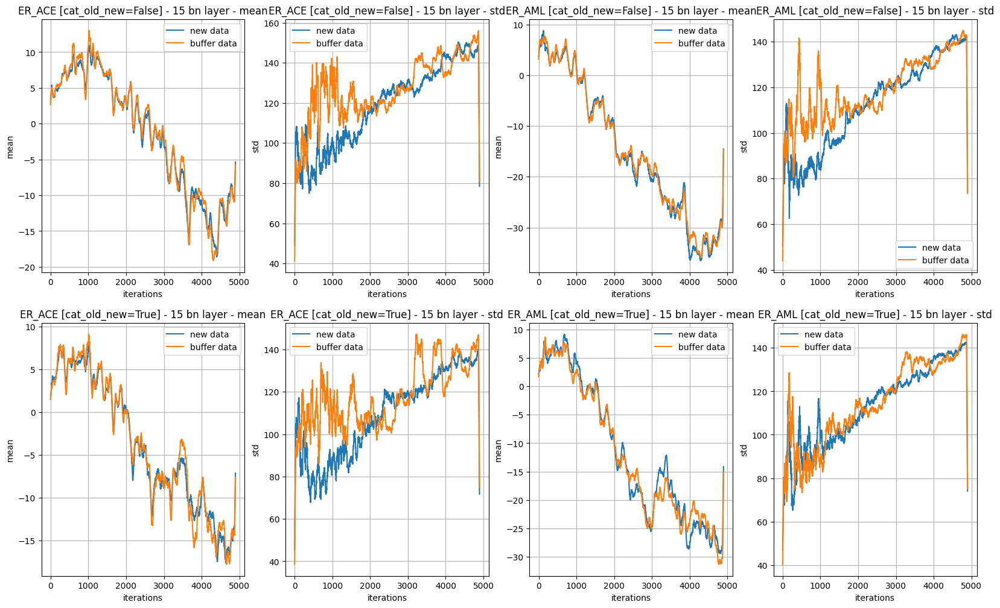

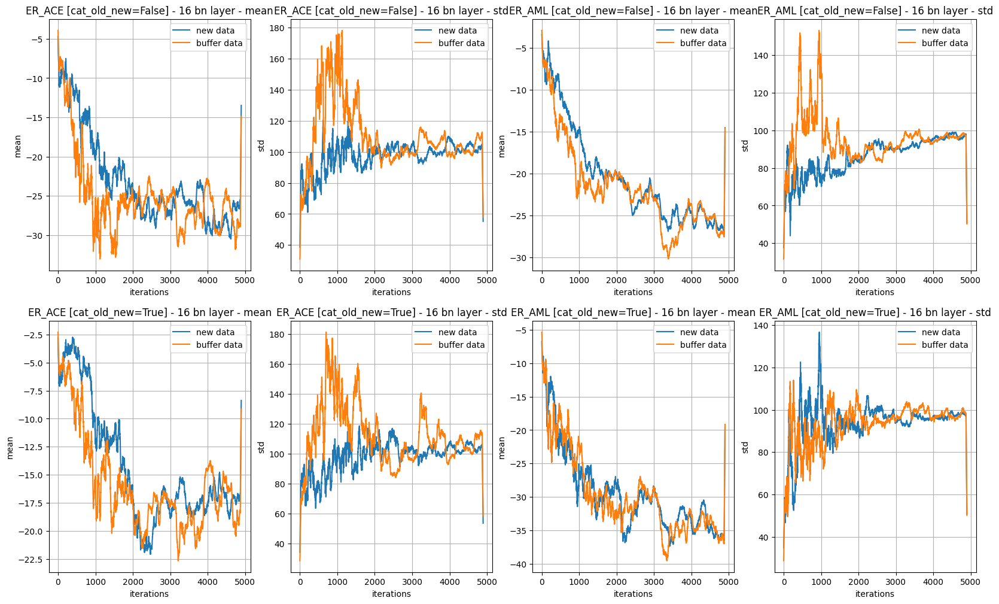

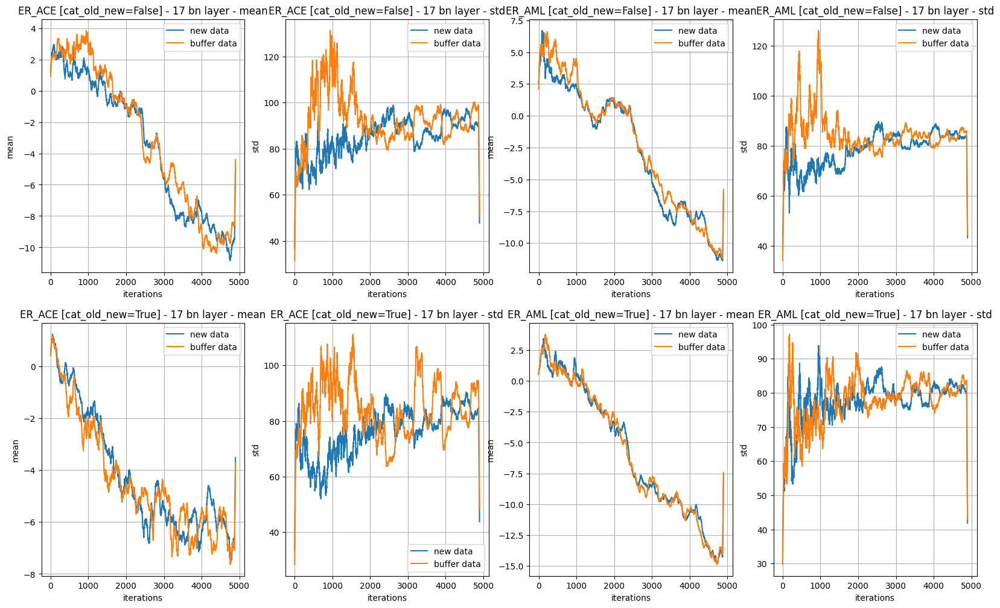

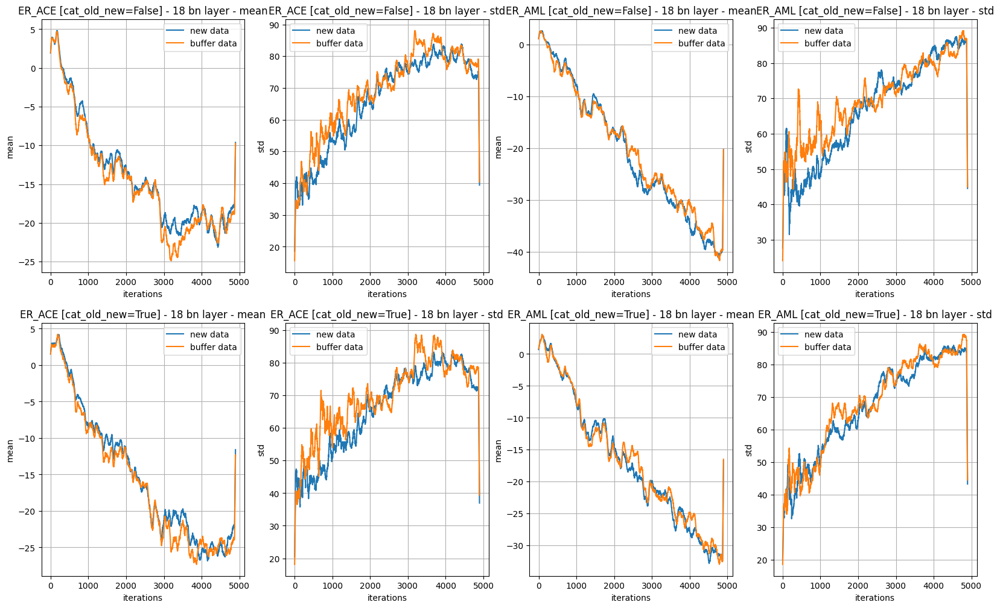

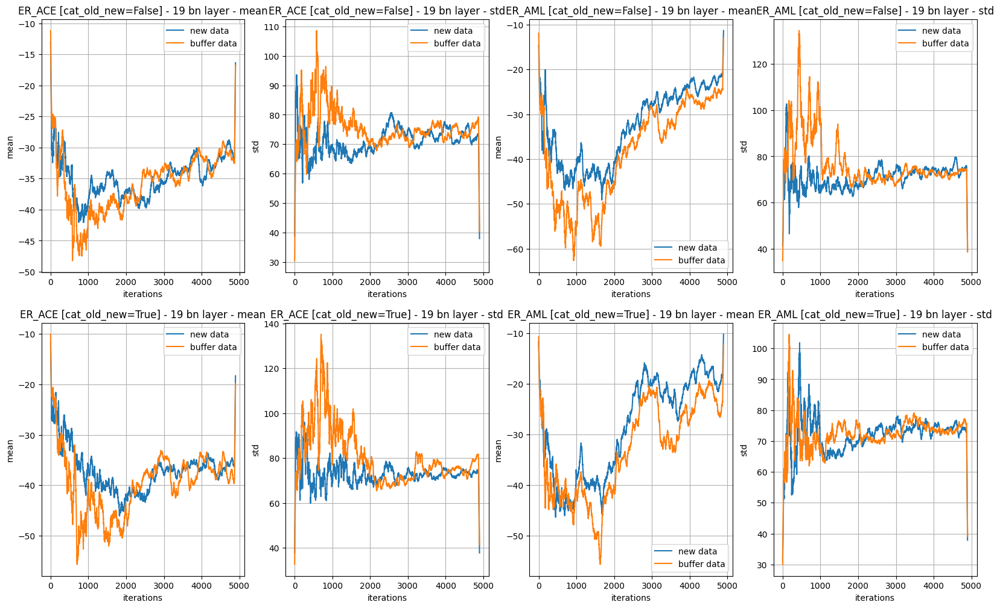

In [8]:
for n_layer in range(len(bn_layers)):
    plot_bn_stats_over_epochs(catoldnew_results, n_layer=n_layer)